In [1]:
%load_ext autoreload
%autoreload 2

from sklearn.utils import shuffle


import numpy as np
import pandas as pd
import random

pd.options.display.max_rows = 100
pd.options.display.max_columns = 200


import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")

import sys
sys.path.append("../")
import src

from sklearn.dummy import DummyClassifier

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder

import lightgbm as lgb
import optuna.integration.lightgbm as olgb

from sklearn.metrics import auc
from sklearn.metrics import log_loss
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_auc_score

from sklearn.model_selection import train_test_split

from scipy.misc import derivative

import types

import optuna

from sklearn.calibration import CalibratedClassifierCV
from sklearn.calibration import IsotonicRegression
from sklearn.calibration import calibration_curve
from sklearn.linear_model import LogisticRegression

In [2]:
def focal_loss_lgb(y_pred, dtrain, alpha, gamma):
    """
    Adapation of the Focal Loss for lightgbm to be used as loss function.
    Parameters:
    -----------
        y_pred: numpy.ndarray
            array with the predictions
        dtrain: lightgbm.Dataset
        alpha, gamma: float
            See original paper https://arxiv.org/pdf/1708.02002.pdf
    
    Returns:
    ---------
        grad: float, 
        hess: float
        
    """
    
    a,g = alpha, gamma
    y_true = dtrain.label
    
    def fl(x,t):
        p = 1/(1+np.exp(-x))
        return -( a*t + (1-a)*(1-t) ) * (( 1 - ( t*p + (1-t)*(1-p)) )**g) * ( t*np.log(p)+(1-t)*np.log(1-p) )
    
    partial_fl = lambda x: fl(x, y_true)
    grad = derivative(partial_fl, y_pred, n=1, dx=1e-6)
    hess = derivative(partial_fl, y_pred, n=2, dx=1e-6)
    
    return grad, hess

In [3]:
def focal_loss_lgb_eval_error(y_pred, dtrain, alpha, gamma):
    """
    Adapation of the Focal Loss for lightgbm to be used as evaluation loss.
    Parameters:
    -----------
        y_pred: numpy.ndarray
            array with the predictions
        dtrain: lightgbm.Dataset
        alpha, gamma: float
            See original paper https://arxiv.org/pdf/1708.02002.pdf
    
    Returns:
        name: str, 
        eval_result: float, 
        is_higher_better: bool  
        
    """
    a,g = alpha, gamma
    y_true = dtrain.label

    p = 1/(1+np.exp(-y_pred))
    loss = -( a*y_true + (1-a)*(1-y_true) ) * (( 1 - ( y_true*p + (1-y_true)*(1-p)) )**g) * ( y_true*np.log(p)+(1-y_true)*np.log(1-p) )
    
    # (eval_name, eval_result, is_higher_better)
    return 'focal_loss', np.mean(loss), False

In [4]:
def predict_proba(self, dataframe):
    '''
    custom to predict probability from lgbm raw results
    (lgbm returns raw results when using a custom loss function)
    '''
    raw = self.predict(dataframe)
    return 1/(1+np.exp(-raw))

# DATA AND MODEL PARAMETERS

In [5]:
data = pd.read_csv('../data/credit_dataset.csv')

In [6]:
data.head(2)

,Unnamed: 0,ID,GENDER,CAR,REALITY,NO_OF_CHILD,INCOME,INCOME_TYPE,EDUCATION_TYPE,FAMILY_TYPE,HOUSE_TYPE,FLAG_MOBIL,WORK_PHONE,PHONE,E_MAIL,FAMILY SIZE,BEGIN_MONTH,AGE,YEARS_EMPLOYED,TARGET
0,0,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,1,0,0,0,2.0,29,59,3,0
1,1,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,1,0,1,1,1.0,4,52,8,0


In [7]:
data.describe()

,Unnamed: 0,ID,NO_OF_CHILD,INCOME,FLAG_MOBIL,WORK_PHONE,PHONE,E_MAIL,FAMILY SIZE,BEGIN_MONTH,AGE,YEARS_EMPLOYED,TARGET
count,25134.000000,2.513400e+04,25134.000000,2.513400e+04,25134.0,25134.000000,25134.000000,25134.000000,25134.000000,25134.000000,25134.000000,25134.000000,25134.000000
mean,12566.500000,5.078838e+06,0.512334,1.948339e+05,1.0,0.273812,0.292791,0.100660,2.294064,26.120594,40.536166,7.204106,0.016790
std,7255.705169,4.194102e+04,0.787785,1.045110e+05,0.0,0.445923,0.455052,0.300885,0.947590,16.439658,9.559474,6.414231,0.128486
min,0.000000,5.008806e+06,0.000000,2.700000e+04,1.0,0.000000,0.000000,0.000000,1.000000,0.000000,21.000000,0.000000,0.000000
25%,6283.250000,5.042228e+06,0.000000,1.350000e+05,1.0,0.000000,0.000000,0.000000,2.000000,12.000000,33.000000,3.000000,0.000000
50%,12566.500000,5.079004e+06,0.000000,1.800000e+05,1.0,0.000000,0.000000,0.000000,2.000000,24.000000,40.000000,5.000000,0.000000
75%,18849.750000,5.115604e+06,1.000000,2.250000e+05,1.0,1.000000,1.000000,0.000000,3.000000,39.000000,48.000000,10.000000,0.000000
max,25133.000000,5.150487e+06,19.000000,1.575000e+06,1.0,1.000000,1.000000,1.000000,20.000000,60.000000,67.000000,43.000000,1.000000


In [8]:
categorical_features = ['GENDER','CAR','REALITY','INCOME_TYPE','EDUCATION_TYPE','FAMILY_TYPE','HOUSE_TYPE','WORK_PHONE','PHONE','E_MAIL']
numerical_features = ['INCOME','NO_OF_CHILD','FAMILY SIZE','BEGIN_MONTH','AGE','YEARS_EMPLOYED']
id_column = 'ID'
target_column = 'TARGET'

In [9]:
print(f"null values for all columns:\n----------------------- \n{data.isna().sum()}")

null values for all columns:
----------------------- 
Unnamed: 0        0
ID                0
GENDER            0
CAR               0
REALITY           0
NO_OF_CHILD       0
INCOME            0
INCOME_TYPE       0
EDUCATION_TYPE    0
FAMILY_TYPE       0
HOUSE_TYPE        0
FLAG_MOBIL        0
WORK_PHONE        0
PHONE             0
E_MAIL            0
FAMILY SIZE       0
BEGIN_MONTH       0
AGE               0
YEARS_EMPLOYED    0
TARGET            0
dtype: int64


In [10]:
print(f"data types for all columns:\n----------------------- \n{data.dtypes}")

data types for all columns:
----------------------- 
Unnamed: 0          int64
ID                  int64
GENDER             object
CAR                object
REALITY            object
NO_OF_CHILD         int64
INCOME            float64
INCOME_TYPE        object
EDUCATION_TYPE     object
FAMILY_TYPE        object
HOUSE_TYPE         object
FLAG_MOBIL          int64
WORK_PHONE          int64
PHONE               int64
E_MAIL              int64
FAMILY SIZE       float64
BEGIN_MONTH         int64
AGE                 int64
YEARS_EMPLOYED      int64
TARGET              int64
dtype: object


In [11]:
print(f"categories for categorical columns \n ------------------------------")
for i in categorical_features:
    print(f"{i}: {data[i].unique()} \n _____")

categories for categorical columns 
 ------------------------------
GENDER: ['M' 'F'] 
 _____
CAR: ['Y' 'N'] 
 _____
REALITY: ['Y' 'N'] 
 _____
INCOME_TYPE: ['Working' 'Commercial associate' 'State servant' 'Student' 'Pensioner'] 
 _____
EDUCATION_TYPE: ['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree'] 
 _____
FAMILY_TYPE: ['Married' 'Single / not married' 'Civil marriage' 'Separated' 'Widow'] 
 _____
HOUSE_TYPE: ['House / apartment' 'Rented apartment' 'Municipal apartment'
 'With parents' 'Co-op apartment' 'Office apartment'] 
 _____
WORK_PHONE: [0 1] 
 _____
PHONE: [0 1] 
 _____
E_MAIL: [0 1] 
 _____


In [12]:
print(f"data balance: {round(data.loc[data['TARGET']==1].shape[0]/data.shape[0]*100,2)} %")
data.shape

data balance: 1.68 %


(25134, 20)

# EXPLORE DATA

### Visualize Input Data

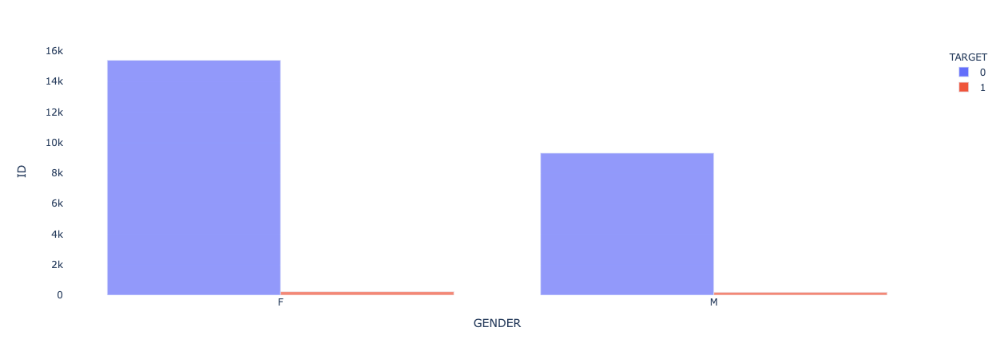

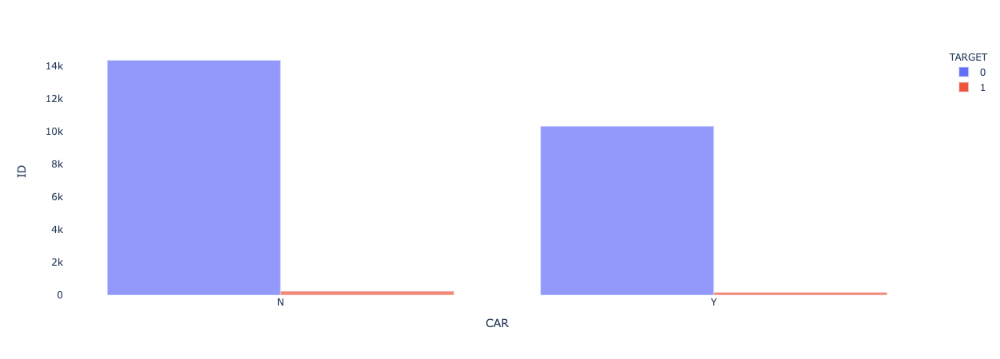

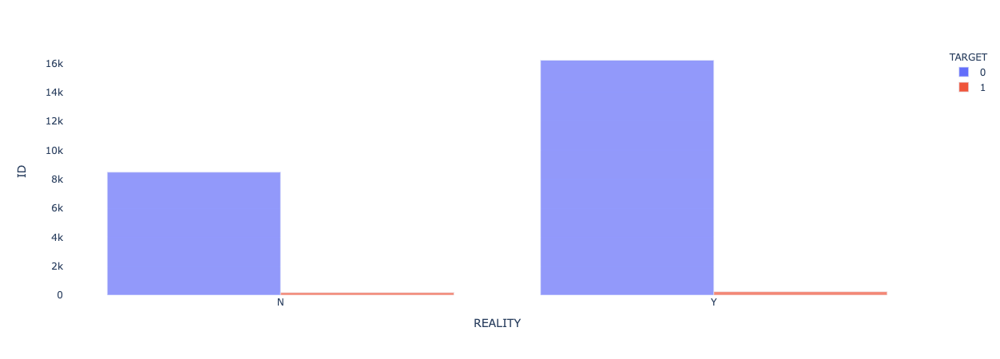

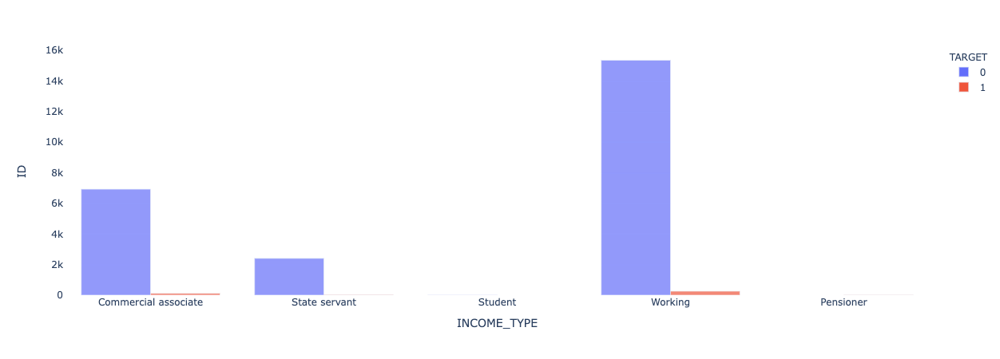

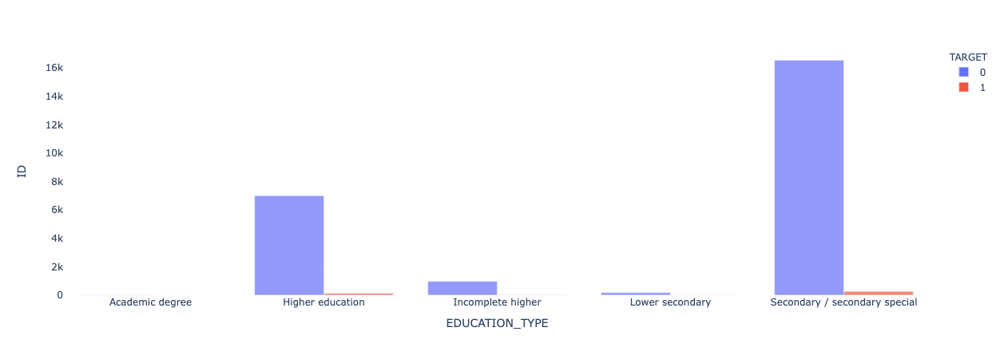

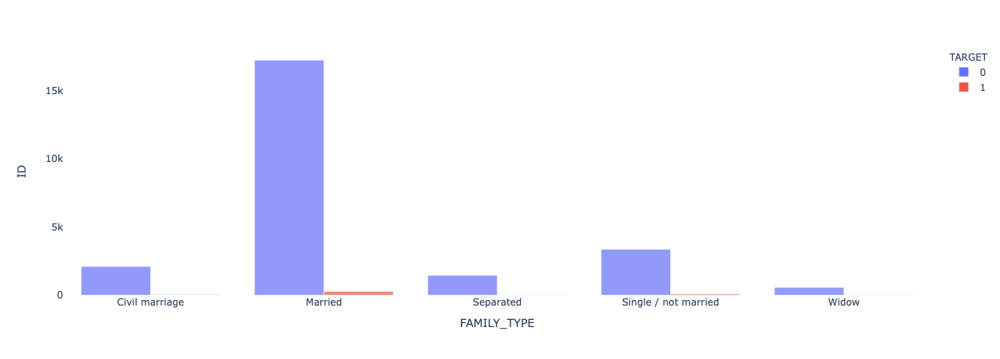

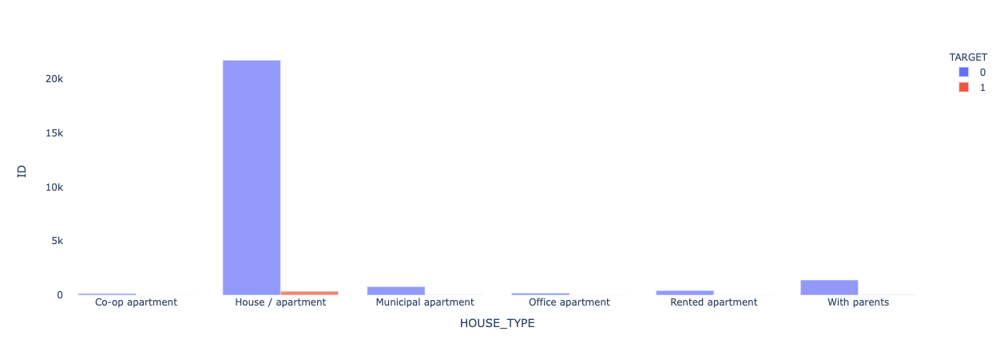

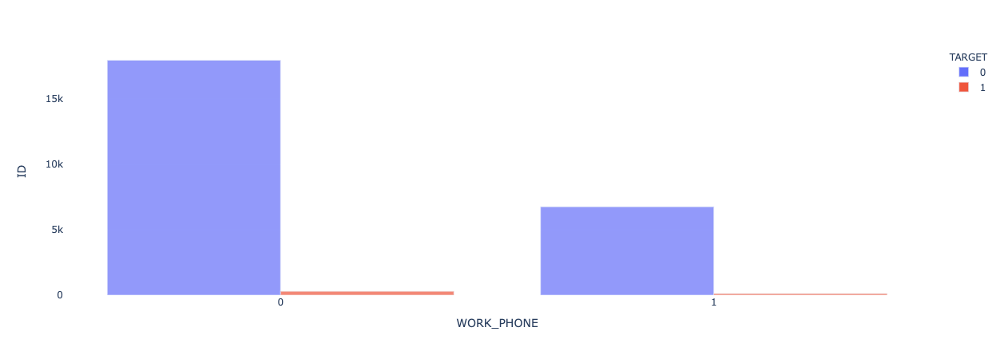

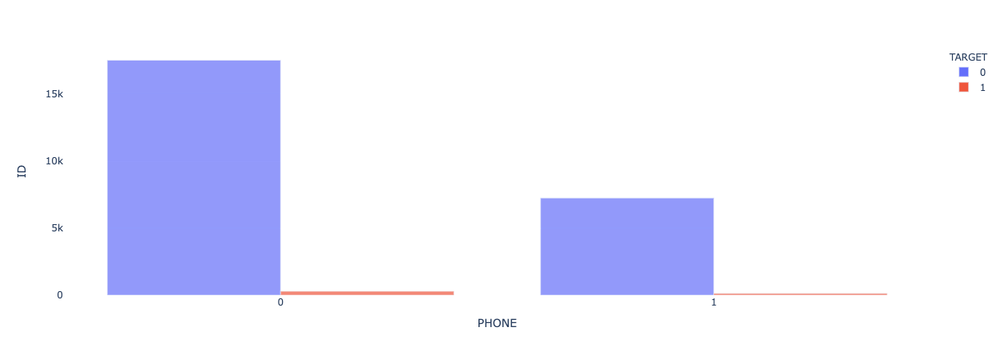

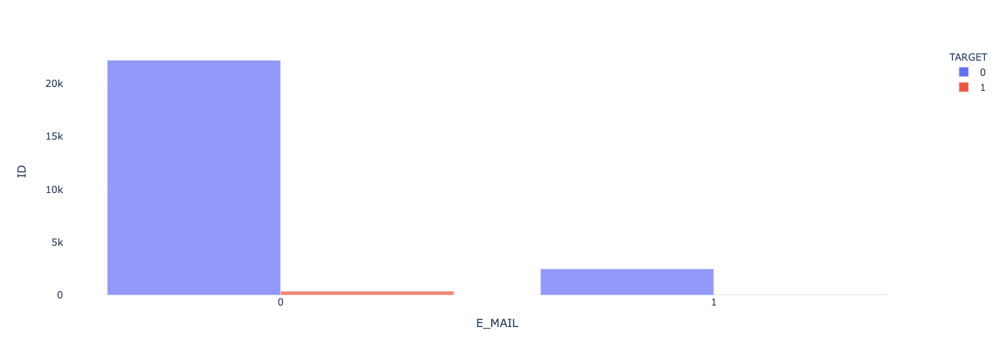

In [13]:
# Categorical
# Para cada categoria, cuantos en la clase 1 y cuantos en la clase 0

for variable in categorical_features:
    fig = px.bar(data.groupby(by=[variable,'TARGET'])['ID'].count().reset_index().astype({'TARGET':'object'}),
                 x= variable, 
                 y = 'ID',
                 color = 'TARGET',
                 barmode = 'group',
                 opacity = 0.7)
    
    fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)')
    fig.show()

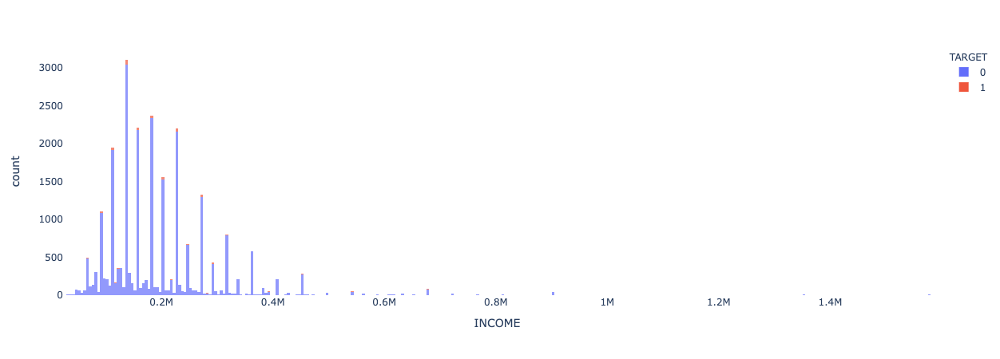

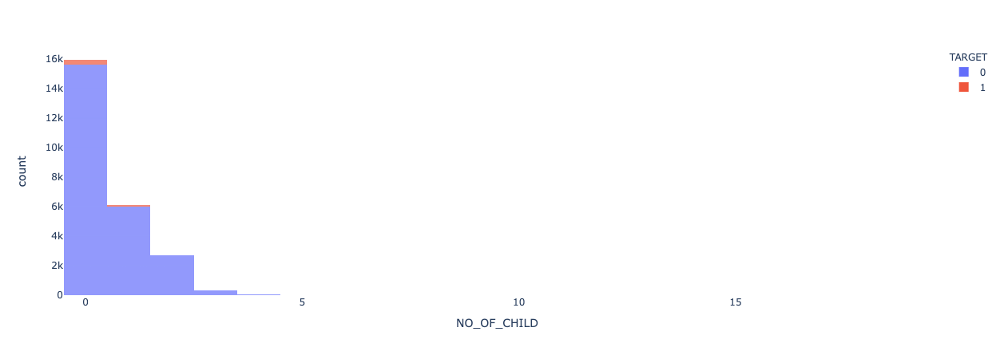

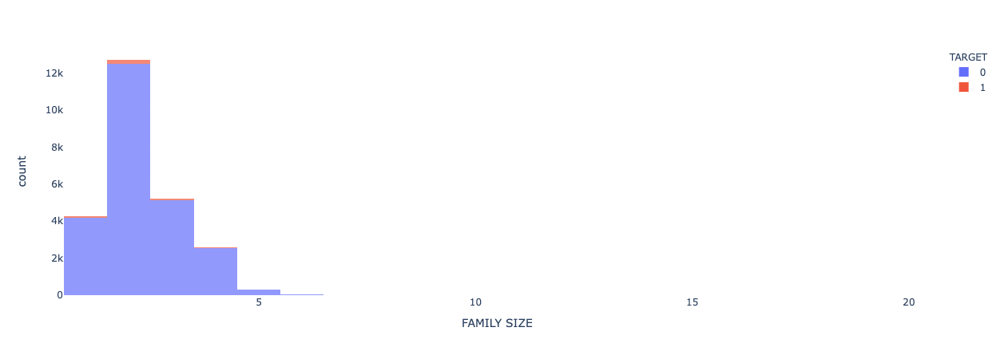

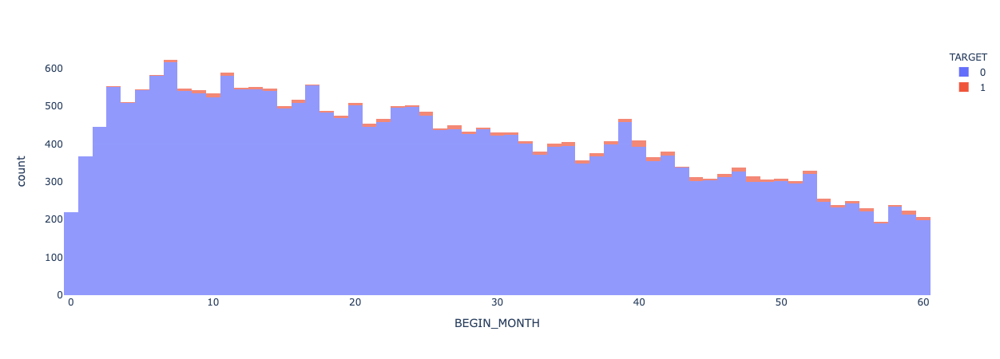

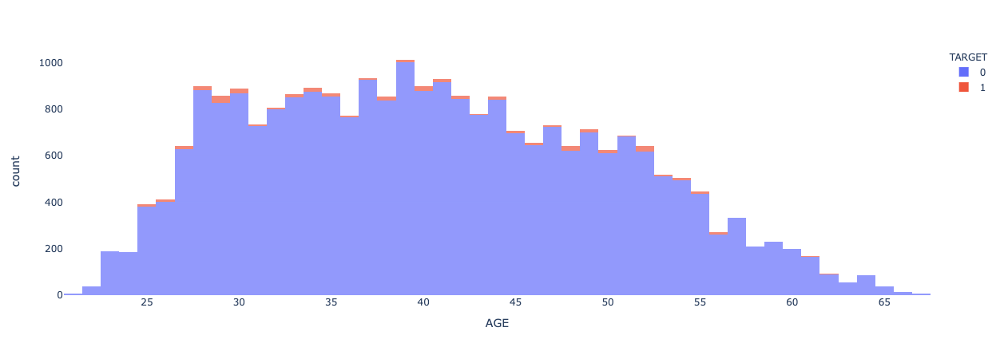

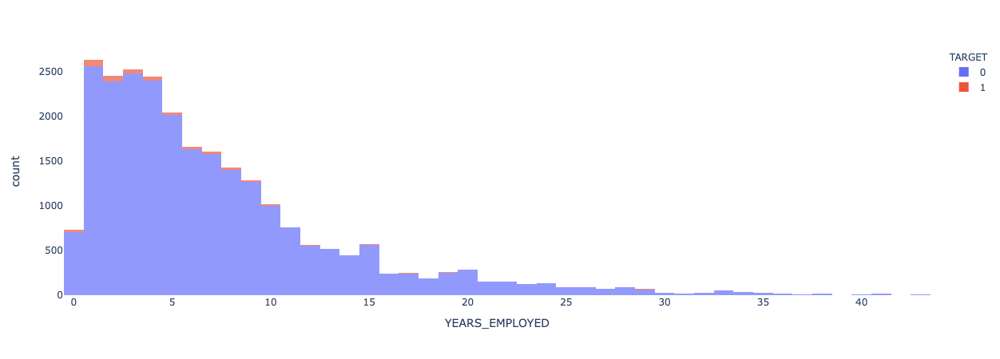

In [14]:
# Numerical
# Histograma con colores separados por 0 e 1
# Correlacion heatmap

for variable in numerical_features:
    fig = px.histogram(data, 
                       x= variable, 
                       color = 'TARGET',
                       opacity = 0.7)
    
    fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)')
    fig.show()

# PREPARE DATASETS FOR TUNING AND TRAINING

In [15]:
train, valid = train_test_split(data, test_size = 0.18,random_state=40)
train, calib = train_test_split(train, test_size = 0.21,random_state=40)
train, test = train_test_split(train, test_size = 0.23,random_state=40)

print(f"train dataset size: {train.shape[0]} \ntrain umbalance: {train.loc[train[target_column]==1].shape[0]/train.shape[0]}")
print(f"train pct of data: {train.shape[0]/data.shape[0]} \n----------------------")

print(f"validate dataset size: {valid.shape[0]} \nvalidate umbalance: {valid.loc[valid[target_column]==1].shape[0]/valid.shape[0]}")
print(f"validate pct of data: {valid.shape[0]/data.shape[0]} \n----------------------")

print(f"calibrate dataset size: {calib.shape[0]} \nvalidate umbalance: {calib.loc[calib[target_column]==1].shape[0]/calib.shape[0]}")
print(f"calibrate pct of data: {calib.shape[0]/data.shape[0]} \n----------------------")

print(f"test dataset size: {test.shape[0]} \ntest umbalance: {test.loc[test[target_column]==1].shape[0]/test.shape[0]}")
print(f"test pct of data: {test.shape[0]/data.shape[0]} \n----------------------")

train dataset size: 12536 
train umbalance: 0.016991065730695597
train pct of data: 0.4987666109652264 
----------------------
validate dataset size: 4525 
validate umbalance: 0.015911602209944753
validate pct of data: 0.18003501233389035 
----------------------
calibrate dataset size: 4328 
validate umbalance: 0.017097966728280962
calibrate pct of data: 0.17219702395161932 
----------------------
test dataset size: 3745 
test umbalance: 0.016822429906542057
test pct of data: 0.14900135274926393 
----------------------


In [16]:
dummy_clf = DummyClassifier(strategy="most_frequent")
X = train.loc[:,categorical_features+numerical_features]
y = train.loc[:,[target_column]]

dummy_clf.fit(  train.loc[:,categorical_features+numerical_features], 
                train.loc[:,[target_column]]
                )

# NO SKILL AVERAGE PRECISION
no_skill_average_precision_score = average_precision_score(test[target_column].values,
                        dummy_clf.predict_proba(test.loc[:,categorical_features+numerical_features])[:,1]
)

## NO SKILL AUC

fpr, tpr, thresholds = roc_curve(test[target_column].values, 
                                dummy_clf.predict_proba(test.loc[:,categorical_features+numerical_features])[:,1]
                                    )
no_skill_auc = auc(fpr, tpr)

## NO SKILL LOGLOSS


no_skill_log_loss = log_loss(test[target_column].values, 
        dummy_clf.predict_proba(test.loc[:,categorical_features+numerical_features])[:,1]
        )

print(f"no skill auc: {round(no_skill_auc, 4)}")
print(f"no skill logloss: {round(no_skill_log_loss,4)}")
print(f"no skill average precision score: {round(no_skill_average_precision_score,4)}")


no skill auc: 0.5
no skill logloss: 0.581
no skill average precision score: 0.0168


In [17]:
#For categorical variables, we first need to impute NaN values, and then encode.
categorical_transformer = Pipeline(
        steps=[
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("encoder", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=np.nan)),
            
        ]
    )
    
    #For numerical variables, we only use an imputer (no need to encode or scale)
numeric_transformer = SimpleImputer(strategy="most_frequent")
    
#Create preprocessor
preprocessor = ColumnTransformer(
        transformers=[
            ("cat", categorical_transformer, categorical_features),
            ("num", numeric_transformer, numerical_features),
        ]
    )


#Fit preprocessor to existing data
preprocessor.fit(train.loc[:, categorical_features+numerical_features])

print(preprocessor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('encoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=nan))]),
                                 ['GENDER', 'CAR', 'REALITY', 'INCOME_TYPE',
                                  'EDUCATION_TYPE', 'FAMILY_TYPE', 'HOUSE_TYPE',
                                  'WORK_PHONE', 'PHONE', 'E_MAIL']),
                                ('num', SimpleImputer(strategy='most_frequent'),
                                 ['INCOME', 'NO_OF_CHILD', 'FAMILY SIZE',
                                  'BEGIN_MONTH', 'AGE', 'YEARS_EMPLOYED'])])


In [18]:
# Transform x with preprocessor
X_train_transformed = pd.DataFrame(
        preprocessor.transform(
            train.loc[:,categorical_features
                        +numerical_features]),
        columns=categorical_features+numerical_features)

X_calib_transformed = pd.DataFrame(
        preprocessor.transform(
            calib.loc[:,categorical_features
                        +numerical_features]),
        columns=categorical_features+numerical_features)

X_valid_transformed = pd.DataFrame(
        preprocessor.transform(
            valid.loc[:,categorical_features
                        +numerical_features]),
        columns=categorical_features+numerical_features)

X_test_transformed = pd.DataFrame(
        preprocessor.transform(
            test.loc[:,categorical_features
                        +numerical_features]),
        columns=categorical_features+numerical_features)


# Create LGBM datasets
train_dset = lgb.Dataset(
        pd.DataFrame(X_train_transformed,
                    columns=categorical_features+numerical_features),
        categorical_feature=categorical_features,
        label=train.loc[:,[target_column]],
        free_raw_data=False)

calib_dset = lgb.Dataset(
        pd.DataFrame(X_calib_transformed,
                    columns=categorical_features+numerical_features),
        categorical_feature=categorical_features,
        label=calib.loc[:,[target_column]],
        free_raw_data=False)

valid_dset = lgb.Dataset(
        pd.DataFrame(X_valid_transformed, 
                    columns=categorical_features+numerical_features),
        categorical_feature=categorical_features,
        label= valid.loc[:,[target_column]],
        free_raw_data=False)

test_dset = lgb.Dataset(
        pd.DataFrame(X_test_transformed, 
                    columns=categorical_features+numerical_features),
        categorical_feature=categorical_features,
        label= test.loc[:,[target_column]],
        free_raw_data=False)

In [19]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(X_train_transformed)
pca_values = pca.transform(X_train_transformed)


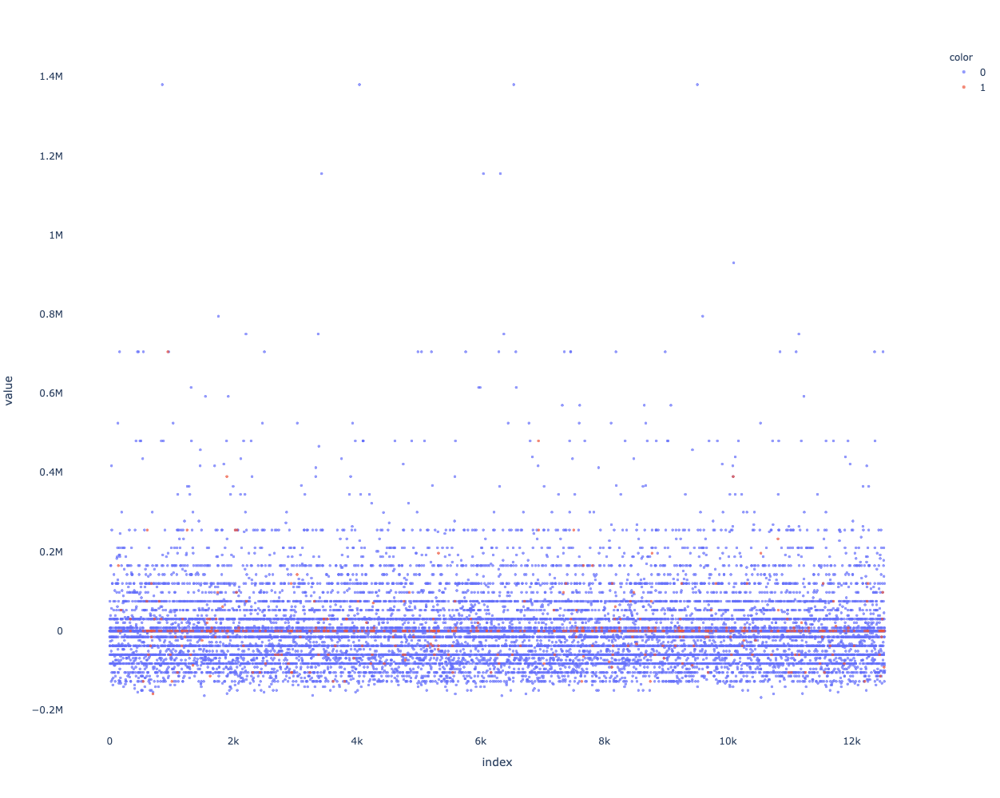

In [20]:
fig = px.scatter(pca_values, color = [str(i) for i in train[target_column].values], opacity = 0.7)
fig.update_layout(width = 1000,
                  height = 1000,
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')

fig.update_traces(marker=dict(size=4))

fig.show()

## LGBM LOG LOSS OBJECTIVE
+ Metrics
+ ROC + PR curves

#### TUNE

In [21]:
def get_study_results(study:optuna.study)->dict:
    """_summary_

    Args:
        study (optuna.study): _description_

    Returns:
        dict: _description_
    """

    trial = study.best_trial
    study_params = trial.params

    fig = optuna.visualization.plot_slice(study, params=study_params)
    fig.show()
    
    fig = optuna.visualization.plot_param_importances(study)
    fig.show()
    
    print(f"-------------------------------------------------------- \n Number of finished trials: {len(study.trials)}")
    
    print("Best trial:")

    print("  Value: {}".format(trial.value))

    print("  Params: ")
    for key, value in study_params.items():
        print("    {}: {}".format(key, value))

    print("--------------------------------------------------------")

    return study_params

In [22]:
def log_loss_objective(trial,
                       train_dset,
                       valid_dset,
                       model_params,
                       predict_proba_func = predict_proba):
    
    params_for_tuning =  {"lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
                           "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
                           "num_leaves": trial.suggest_int("num_leaves", 2, 256),
                           "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
                           "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
                           "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
                           "min_child_samples": trial.suggest_int("min_child_samples", 2, 30),
                         }
    
    model_params.update(params_for_tuning)

    lgbm_model = lgb.train(params=model_params,
                           
                           train_set=train_dset,
                           valid_sets=[valid_dset,],
                           
                           early_stopping_rounds=25,
                           verbose_eval = False
                          )

    lgbm_model.predict_proba = types.MethodType(predict_proba_func, lgbm_model)
    
    metric = average_precision_score(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    #metric = log_loss(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    
    return metric

[I 2022-03-31 15:25:06,006] A new study created in memory with name: no-name-e0392c90-179f-4f52-aa5a-cbb029bc5437


{'objective': 'cross_entropy', 'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.1, 'verbosity': -1, 'seed': 62}


[I 2022-03-31 15:25:06,294] Trial 0 finished with value: 0.13936998337278725 and parameters: {'lambda_l1': 0.0011442919114985069, 'lambda_l2': 3.293050326982609e-05, 'num_leaves': 15, 'feature_fraction': 0.9363037128074158, 'bagging_fraction': 0.6695250195964177, 'bagging_freq': 7, 'min_child_samples': 14}. Best is trial 0 with value: 0.13936998337278725.
[I 2022-03-31 15:25:06,733] Trial 1 finished with value: 0.1822850747286077 and parameters: {'lambda_l1': 0.3082055522713985, 'lambda_l2': 0.0037157725485601452, 'num_leaves': 80, 'feature_fraction': 0.5805435754756084, 'bagging_fraction': 0.6803172980845019, 'bagging_freq': 6, 'min_child_samples': 30}. Best is trial 1 with value: 0.1822850747286077.
[I 2022-03-31 15:25:07,148] Trial 2 finished with value: 0.12057855582849615 and parameters: {'lambda_l1': 2.6576861980589603, 'lambda_l2': 0.20849096120237798, 'num_leaves': 222, 'feature_fraction': 0.9464545334230732, 'bagging_fraction': 0.46415152023215356, 'bagging_freq': 4, 'min_chil

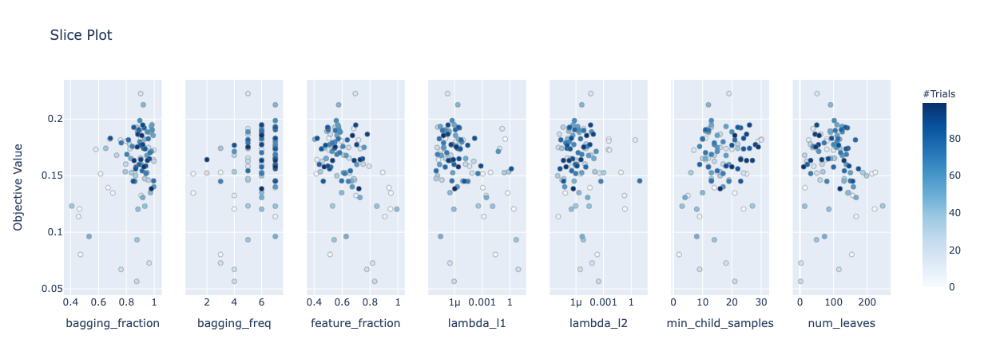

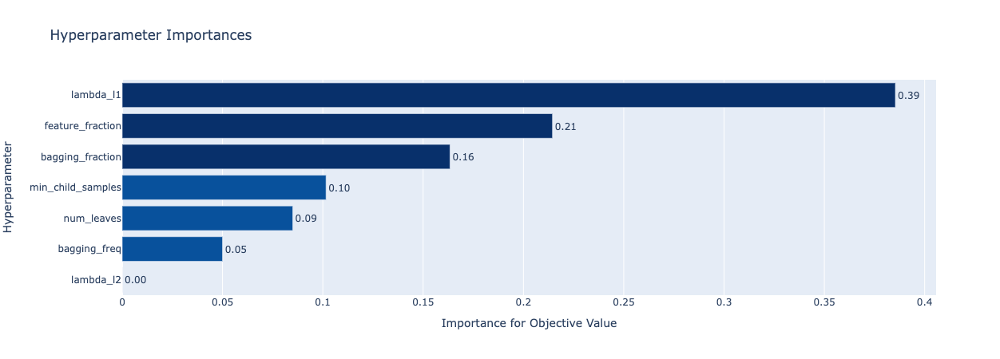

-------------------------------------------------------- 
 Number of finished trials: 100
Best trial:
  Value: 0.2225707630640988
  Params: 
    lambda_l1: 1.78720513921874e-07
    lambda_l2: 4.0398775336521896e-05
    num_leaves: 51
    feature_fraction: 0.6949375303647839
    bagging_fraction: 0.9023992908367424
    bagging_freq: 5
    min_child_samples: 19
--------------------------------------------------------
{'objective': 'cross_entropy', 'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.1, 'verbosity': -1, 'seed': 62, 'lambda_l1': 1.0576032954292306e-06, 'lambda_l2': 5.136414792093079e-07, 'num_leaves': 119, 'feature_fraction': 0.7206333770466969, 'bagging_fraction': 0.9790332257486266, 'bagging_freq': 6, 'min_child_samples': 16} 
 --------------------------------


In [23]:
params_logloss = {'objective': 'cross_entropy',
                  "boosting": "gbdt",
                  "deterministic":True,
                  "num_iterations": 10000, #Will have early stopping for tunning
                  'learning_rate':0.1,
                  'verbosity':-1,
                  'seed':62
                 }
    
print(params_logloss)
    
# -----------------------------------------------------
# TUNE LOSS FUNCTION
# -----------------------------------------------------
pruner=optuna.pruners.PercentilePruner(25.0, n_startup_trials=5, n_warmup_steps=30, interval_steps=10)
log_Loss_study = optuna.create_study(pruner=pruner,
                                     direction='maximize')

log_Loss_study.optimize(lambda trial: log_loss_objective(trial,
                                                         train_dset,
                                                         valid_dset,
                                                         params_logloss),
                        n_trials=100)

best_params = get_study_results(log_Loss_study)
print(f"{params_logloss} \n --------------------------------")

#### ITERS

#### TRAIN

In [24]:
#params_logloss['metric']=None
#params_logloss['early_stopping_round'] = 0
#params_logloss['num_iterations'] = int(np.median(best_iterations))
#params_logloss['seed'] = None

print(params_logloss)

lgbm_log_loss = lgb.train(params=params_logloss,
                          train_set=train_dset,
                          valid_sets=[valid_dset,],
                          
                          early_stopping_rounds = 25,
                          num_boost_round=10000,
                          
                          verbose_eval = False)
    
lgbm_log_loss.predict_proba = types.MethodType(predict_proba, lgbm_log_loss)

{'objective': 'cross_entropy', 'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.1, 'verbosity': -1, 'seed': 62, 'lambda_l1': 1.0576032954292306e-06, 'lambda_l2': 5.136414792093079e-07, 'num_leaves': 119, 'feature_fraction': 0.7206333770466969, 'bagging_fraction': 0.9790332257486266, 'bagging_freq': 6, 'min_child_samples': 16}


#### CALIBRATE

In [25]:
prob_true, prob_pred = calibration_curve(calib_dset.label, lgbm_log_loss.predict_proba(calib_dset.data), n_bins=100)
print(prob_true)
print(prob_pred)

[0.01268293 0.05128205 0.04878049 0.23809524 0.         0.1
 0.25       0.42857143 0.5        0.         0.         0.
 1.         0.        ]
[0.50230065 0.51449036 0.52433301 0.53478135 0.545307   0.55336502
 0.56399035 0.57357171 0.5871462  0.59415566 0.61180944 0.62560126
 0.64316239 0.6853782 ]


In [26]:
isotonic_log_loss = IsotonicRegression(out_of_bounds='clip',y_min=0,y_max=1)
    
isotonic_log_loss.fit(prob_pred,
                      prob_true)

IsotonicRegression(out_of_bounds='clip', y_max=1, y_min=0)

In [27]:
calibs_train = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_log_loss.predict_proba(calib_dset.data)),
                              'prob_pred_calib':isotonic_log_loss.predict((lgbm_log_loss.predict_proba(calib_dset.data))),
                             })

calibs_valid = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_log_loss.predict_proba(valid_dset.data)),
                              'prob_pred_calib':isotonic_log_loss.predict((lgbm_log_loss.predict_proba(valid_dset.data))),
                             })

#### EVALUATE

##### Metrics

In [28]:
y_true = test_dset.label
probas_pred = (lgbm_log_loss.predict_proba(test_dset.data))
label_pred = [1 if x >=0.5 else 0 for x in probas_pred]

probas_pred_calib = isotonic_log_loss.predict(probas_pred)
label_pred_calib = [1 if x >=0.5 else 0 for x in probas_pred_calib]

In [29]:
avg_prec = round(average_precision_score(y_true, probas_pred),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred),4)

logloss = round(log_loss(y_true, probas_pred),4)


print(f"METRICS FOR LGBM LOGLOSS: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS: 
 ----------------------- 
 Average Precision Score  0.1565  
 AUC: 0.7662 
 LogLoss: 0.699


In [30]:
avg_prec = round(average_precision_score(y_true, probas_pred_calib),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred_calib)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred_calib)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred_calib),4)

logloss = round(log_loss(y_true, probas_pred_calib),4)


print(f"METRICS FOR LGBM LOGLOSS CALIBRATED: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS CALIBRATED: 
 ----------------------- 
 Average Precision Score  0.1354  
 AUC: 0.7319 
 LogLoss: 0.0751


##### ROC / PR Curves

Text(0.5, 1.0, 'PR Curve \n model: LGBM LogLoss Objective')

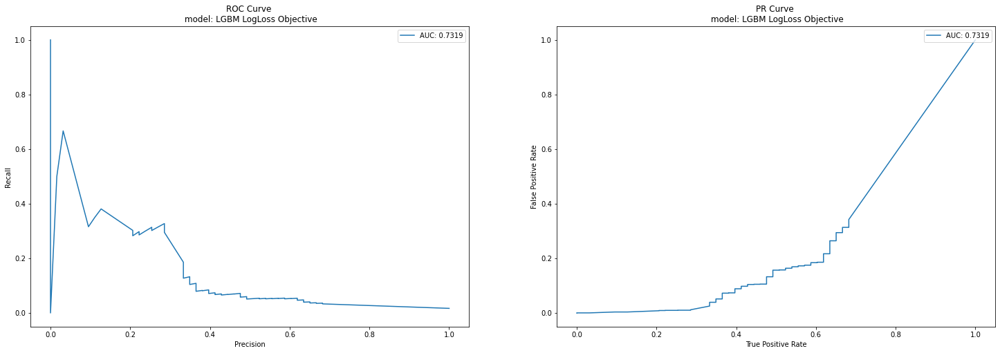

In [31]:
#Holis
fig, axs = plt.subplots(1, 2, figsize = (25,8))

axs[0].plot(recall,precision, label = f"AUC: {pr_auc}")
axs[0].set_xlabel("Precision")
axs[0].set_ylabel("Recall")
axs[0].legend(loc="upper right")
axs[0].set_title(f'ROC Curve \n model: LGBM LogLoss Objective')

axs[1].plot(true_positive_rate,false_positive_rate,label = f"AUC: {pr_auc}")
axs[1].set_xlabel("True Positive Rate")
axs[1].set_ylabel("False Positive Rate")
axs[1].legend(loc="upper right")
axs[1].set_title(f'PR Curve \n model: LGBM LogLoss Objective')

##### Calibration Results

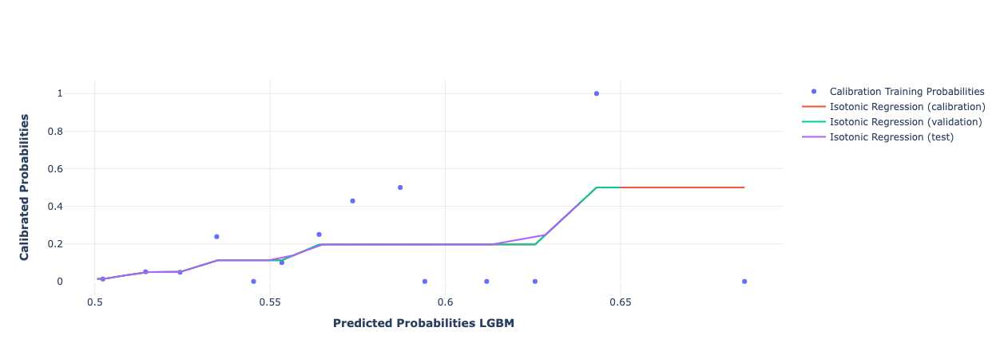

In [32]:
calibs_test = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_log_loss.predict_proba(test_dset.data)),
                                   'prob_pred_calib':isotonic_log_loss.predict((lgbm_log_loss.predict_proba(test_dset.data)))
                                  })

fig = go.Figure()

fig.add_trace(go.Scatter(x=prob_pred, y=prob_true,
                    mode='markers',
                    name='Calibration Training Probabilities'))

fig.add_trace(go.Scatter(x=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (calibration)'))

fig.add_trace(go.Scatter(x=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (validation)'))

fig.add_trace(go.Scatter(x=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (test)'))

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')

fig.update_xaxes(title_text="<b>Predicted Probabilities LGBM</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')
fig.update_yaxes(title_text="<b>Calibrated Probabilities</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')

#fig.update_traces(marker=dict(size=2))

fig.show()

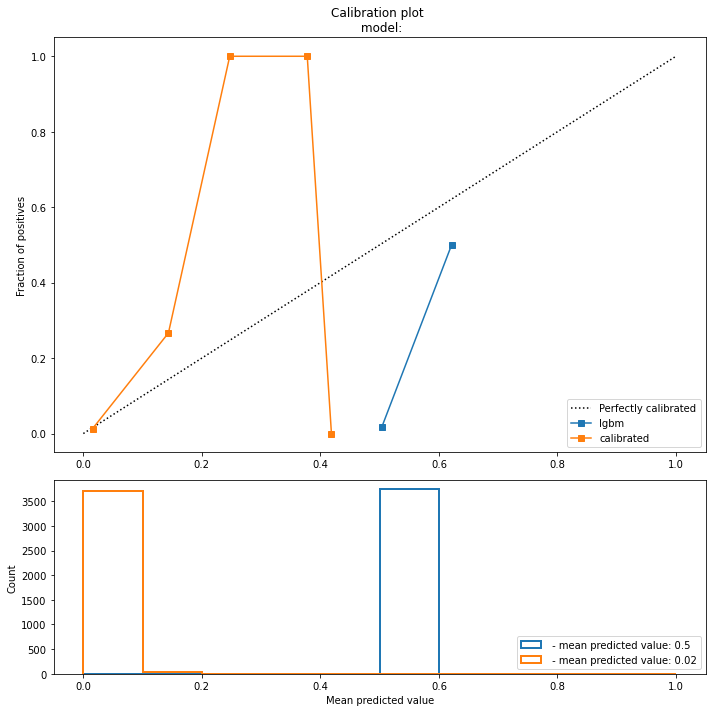

In [33]:
fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
ax2 = plt.subplot2grid((3, 1), (2, 0))
    
ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

probs = {'lgbm':probas_pred, 
         'calibrated':probas_pred_calib}

for name in ['lgbm','calibrated']:
    frac_of_pos, mean_pred_value = calibration_curve(test_dset.label, 
                                                     probs[name],
                                                     n_bins=10)

    ax1.plot(mean_pred_value, frac_of_pos, "s-", label=f'{name}')
    ax2.hist(probs[name], 
             range=(0, 1), 
             bins=10, 
             label=f' - mean predicted value: {round(np.mean(probs[name]),2)}',
             histtype="step", lw=2)
    
ax1.set_ylabel("Fraction of positives")
ax1.set_ylim([-0.05, 1.05])
ax1.legend(loc="lower right")
ax1.set_title(f'Calibration plot \n model:') #ToDo: Fix Name
    
    
ax2.legend(loc="lower right")
ax2.set_xlabel("Mean predicted value")
ax2.set_ylabel("Count")
    
plt.tight_layout()
plt.show()

##### Probability Histograms

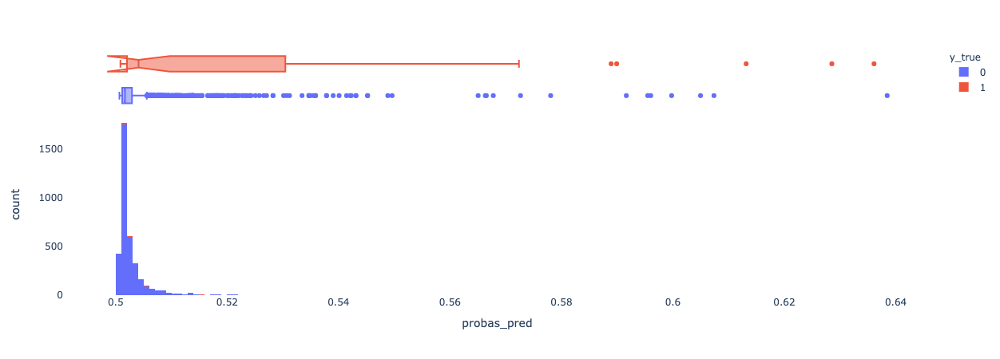

In [34]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred': probas_pred}),
                   x = 'probas_pred',
                   color = 'y_true',
                  marginal = 'box')

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

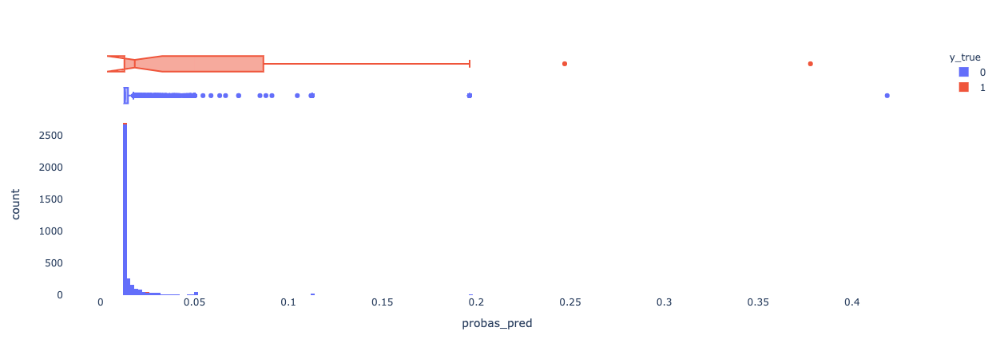

In [35]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred': probas_pred_calib}),
                   x = 'probas_pred',
                   color = 'y_true',
                  marginal = 'box')

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

## LGBM FOCAL LOSS OBJECTIVE (tuning all at once)


#### TUNE

In [36]:
def dual_loss_and_hyperparams_objective(trial, 
                                        train_dset,
                                        valid_dset,
                                        model_params,
                                        predict_proba_func = predict_proba):

    params_for_tuning =  {"lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
                           "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
                           "num_leaves": trial.suggest_int("num_leaves", 2, 256),
                           "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
                           "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
                           "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
                           "min_child_samples": trial.suggest_int("min_child_samples", 2, 30),
                          
                           "alpha":trial.suggest_float('alpha',0.5, 0.99),
                           "gamma":trial.suggest_float('gamma',0, 5)
                          }
    
    model_params.update(params_for_tuning)

    focal_loss = lambda x,y: focal_loss_lgb(x, y, params_for_tuning['alpha'], params_for_tuning['gamma'])
    focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, params_for_tuning['alpha'], params_for_tuning['gamma'])
    
    lgbm_model = lgb.train(params=model_params,
                           
                           train_set=train_dset,
                           valid_sets=[valid_dset,],
                           
                           fobj = focal_loss,
                           feval = focal_loss_eval,
                           
                           early_stopping_rounds=25,
                           verbose_eval = False
                          )

    lgbm_model.predict_proba = types.MethodType(predict_proba_func, lgbm_model)
    
    #metric = log_loss(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    metric = average_precision_score(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    
    return metric

[I 2022-03-31 15:25:49,907] A new study created in memory with name: no-name-ebb15324-b156-4138-9eac-16cb5b24fad3
[I 2022-03-31 15:25:51,334] Trial 0 finished with value: 0.16116621363646227 and parameters: {'lambda_l1': 4.122846926043513e-06, 'lambda_l2': 0.045365744372788126, 'num_leaves': 40, 'feature_fraction': 0.41799332525822636, 'bagging_fraction': 0.6410553470194799, 'bagging_freq': 3, 'min_child_samples': 19, 'alpha': 0.5195643269029523, 'gamma': 4.848981213638844}. Best is trial 0 with value: 0.16116621363646227.
[I 2022-03-31 15:25:52,610] Trial 1 finished with value: 0.16268864221097426 and parameters: {'lambda_l1': 0.0007606963101871948, 'lambda_l2': 5.18639378904318e-08, 'num_leaves': 180, 'feature_fraction': 0.6392227621979218, 'bagging_fraction': 0.8634645334277115, 'bagging_freq': 5, 'min_child_samples': 28, 'alpha': 0.7712711760775788, 'gamma': 0.08385266530242297}. Best is trial 1 with value: 0.16268864221097426.
[I 2022-03-31 15:25:52,960] Trial 2 finished with valu

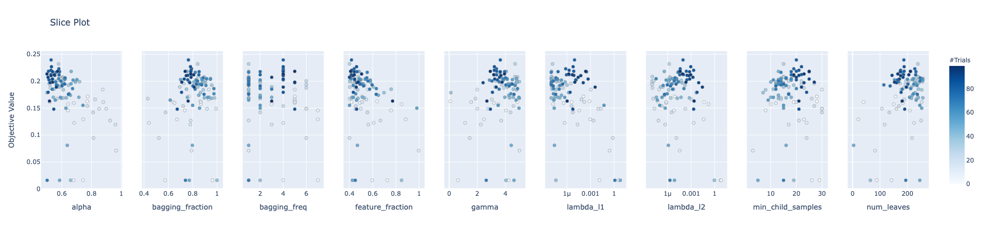

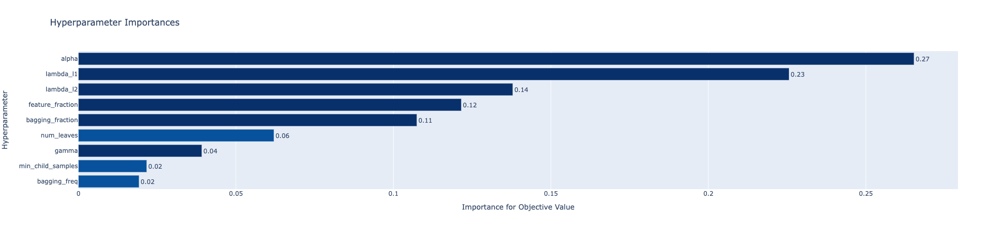

-------------------------------------------------------- 
 Number of finished trials: 100
Best trial:
  Value: 0.23955194318124098
  Params: 
    lambda_l1: 9.41382045333129e-06
    lambda_l2: 9.309468934498606e-05
    num_leaves: 187
    feature_fraction: 0.4176656056656022
    bagging_fraction: 0.7648014322647324
    bagging_freq: 4
    min_child_samples: 20
    alpha: 0.5282834534335503
    gamma: 3.635546986795966
--------------------------------------------------------
{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.1, 'verbosity': -1, 'seed': 62, 'lambda_l1': 9.41382045333129e-06, 'lambda_l2': 9.309468934498606e-05, 'num_leaves': 187, 'feature_fraction': 0.4176656056656022, 'bagging_fraction': 0.7648014322647324, 'bagging_freq': 4, 'min_child_samples': 20, 'alpha': 0.5282834534335503, 'gamma': 3.635546986795966} 
 --------------------------------


In [37]:
# Setup LGBM parameters that will not be subject to tuning
lgbm_focal_loss_1_params = {"boosting": "gbdt",
                            "deterministic":True,
                            "num_iterations": 10000, #Will have early stopping
                            'learning_rate':0.1,
                            'verbosity':-1,
                            'seed' : 62
                           }
    
# Create Optuna study
pruner=optuna.pruners.PercentilePruner(25.0, n_startup_trials=5, n_warmup_steps=30, interval_steps=10)
dual_loss_hyperparams_study = optuna.create_study(pruner=pruner,
                                     direction='maximize')

# Optimize study
dual_loss_hyperparams_study.optimize(lambda trial: 
                                     dual_loss_and_hyperparams_objective(trial, 
                                                                         train_dset,
                                                                         valid_dset,
                                                                         lgbm_focal_loss_1_params), #Set up Optuna's objective function (see below)
                                     n_trials=100) #Set amount of trials

best_params = get_study_results(dual_loss_hyperparams_study)
    
# Update LGBM parameters with tuned parameters
lgbm_focal_loss_1_params.update(best_params)

print(f"{lgbm_focal_loss_1_params} \n --------------------------------")

#### ITERS

#### TRAIN

In [38]:
#lgbm_focal_loss_1_params['metric']=None
#lgbm_focal_loss_1_params['early_stopping_round'] = 0
#lgbm_focal_loss_1_params['num_iterations'] = int(np.mean(best_iterations))
#lgbm_focal_loss_1_params['seed'] = None

print(lgbm_focal_loss_1_params)

focal_loss = lambda x,y: focal_loss_lgb(x, y, lgbm_focal_loss_1_params['alpha'], lgbm_focal_loss_1_params['gamma'])
focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, lgbm_focal_loss_1_params['alpha'], lgbm_focal_loss_1_params['gamma'])


lgbm_focal_loss_1 = lgb.train(params=lgbm_focal_loss_1_params,
                              
                              train_set=train_dset,
                              valid_sets=[valid_dset,],
                              
                              fobj = focal_loss,
                              feval = focal_loss_eval,
                              
                              early_stopping_rounds = 25,
                              num_boost_round=10000,
                              
                              verbose_eval = False)
    
lgbm_focal_loss_1.predict_proba = types.MethodType(predict_proba, lgbm_focal_loss_1)

{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.1, 'verbosity': -1, 'seed': 62, 'lambda_l1': 9.41382045333129e-06, 'lambda_l2': 9.309468934498606e-05, 'num_leaves': 187, 'feature_fraction': 0.4176656056656022, 'bagging_fraction': 0.7648014322647324, 'bagging_freq': 4, 'min_child_samples': 20, 'alpha': 0.5282834534335503, 'gamma': 3.635546986795966}


#### CALIBRATE

In [39]:
prob_true, prob_pred = calibration_curve(calib_dset.label, lgbm_focal_loss_1.predict_proba(calib_dset.data), n_bins=100)
print(prob_true)
print(prob_pred)

[0.         0.         0.00760456 0.00948767 0.01960784 0.00792393
 0.01263538 0.00894855 0.00857143 0.01526718 0.03333333 0.03149606
 0.07407407 0.         0.06818182 0.11538462 0.26666667 0.25
 0.16666667 0.33333333 0.         0.         0.         1.
 0.        ]
[0.19814867 0.20670819 0.21549734 0.22526418 0.23509762 0.24495714
 0.25468882 0.26497433 0.27470546 0.2845266  0.2949488  0.30493719
 0.31445133 0.32517685 0.33446194 0.34429739 0.35438305 0.36435972
 0.3760616  0.38478536 0.40665472 0.41563111 0.43291303 0.44825973
 0.50044872]


In [40]:
isotonic_focal_loss_1 = IsotonicRegression(out_of_bounds='clip',y_min=0,y_max=1)
    
isotonic_focal_loss_1.fit(prob_pred, prob_true)

IsotonicRegression(out_of_bounds='clip', y_max=1, y_min=0)

In [41]:
calibs_train = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_1.predict_proba(calib_dset.data)),
                              'prob_pred_calib':isotonic_focal_loss_1.predict((lgbm_focal_loss_1.predict_proba(calib_dset.data))),
                             })

calibs_valid = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_1.predict_proba(valid_dset.data)),
                              'prob_pred_calib':isotonic_focal_loss_1.predict((lgbm_focal_loss_1.predict_proba(valid_dset.data))),
                             })

#### EVALUATE

##### Metrics

In [42]:
y_true = test_dset.label
probas_pred = (lgbm_focal_loss_1.predict_proba(test_dset.data))
label_pred = [1 if x >=0.5 else 0 for x in probas_pred]

probas_pred_calib = isotonic_focal_loss_1.predict(probas_pred)
label_pred_calib = [1 if x >=0.5 else 0 for x in probas_pred_calib]

In [43]:
avg_prec = round(average_precision_score(y_true, probas_pred),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred),4)

logloss = round(log_loss(y_true, probas_pred),4)


print(f"METRICS FOR LGBM LOGLOSS: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS: 
 ----------------------- 
 Average Precision Score  0.1846  
 AUC: 0.7537 
 LogLoss: 0.3091


In [44]:
avg_prec = round(average_precision_score(y_true, probas_pred_calib),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred_calib)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred_calib)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred_calib),4)

logloss = round(log_loss(y_true, probas_pred_calib),4)


print(f"METRICS FOR LGBM LOGLOSS CALIBRATED: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS CALIBRATED: 
 ----------------------- 
 Average Precision Score  0.1534  
 AUC: 0.7568 
 LogLoss: 0.0735


##### ROC/PR Curves

Text(0.5, 1.0, 'PR Curve \n model: LGBM LogLoss Objective')

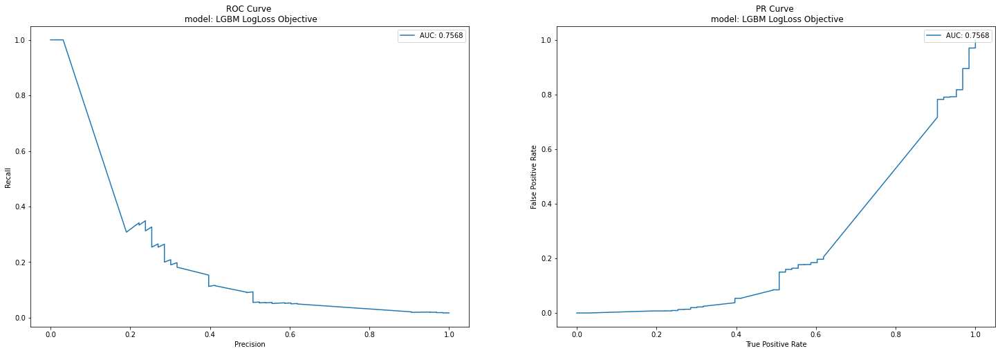

In [45]:
#Holis
fig, axs = plt.subplots(1, 2, figsize = (25,8))

axs[0].plot(recall,precision, label = f"AUC: {pr_auc}")
axs[0].set_xlabel("Precision")
axs[0].set_ylabel("Recall")
axs[0].legend(loc="upper right")
axs[0].set_title(f'ROC Curve \n model: LGBM LogLoss Objective')

axs[1].plot(true_positive_rate,false_positive_rate,label = f"AUC: {pr_auc}")
axs[1].set_xlabel("True Positive Rate")
axs[1].set_ylabel("False Positive Rate")
axs[1].legend(loc="upper right")
axs[1].set_title(f'PR Curve \n model: LGBM LogLoss Objective')

##### Calibration Results

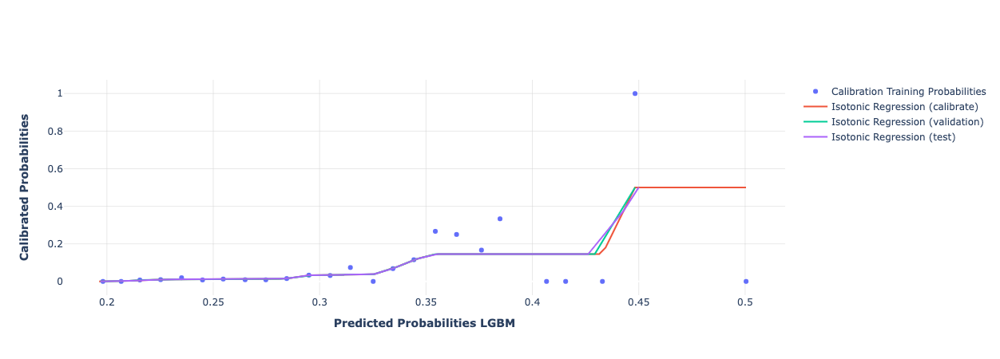

In [46]:
calibs_test = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_1.predict_proba(test_dset.data)),
                                   'prob_pred_calib':isotonic_focal_loss_1.predict((lgbm_focal_loss_1.predict_proba(test_dset.data)))
                                  })

fig = go.Figure()

fig.add_trace(go.Scatter(x=prob_pred, y=prob_true,
                    mode='markers',
                    name='Calibration Training Probabilities'))

fig.add_trace(go.Scatter(x=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (calibrate)'))

fig.add_trace(go.Scatter(x=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (validation)'))

fig.add_trace(go.Scatter(x=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (test)'))

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')

fig.update_xaxes(title_text="<b>Predicted Probabilities LGBM</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')
fig.update_yaxes(title_text="<b>Calibrated Probabilities</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')

#fig.update_traces(marker=dict(size=2))

fig.show()

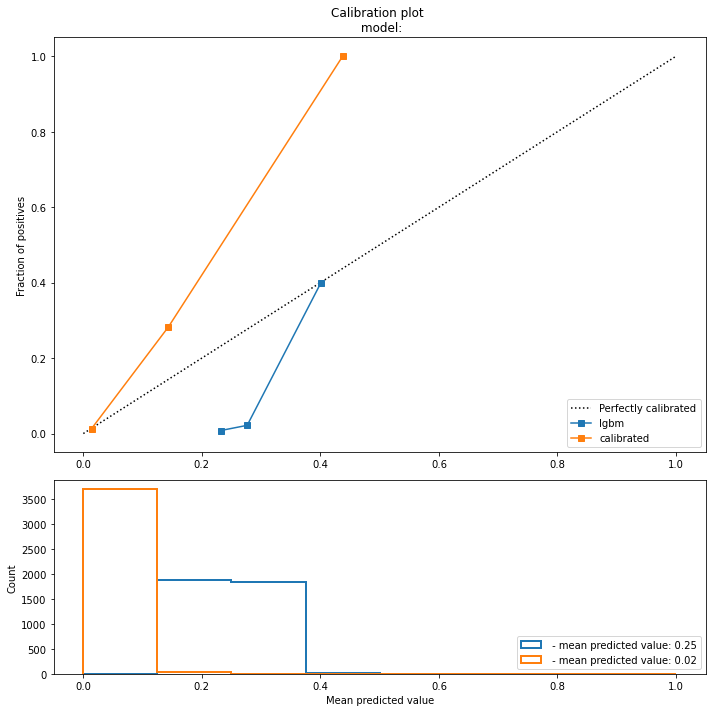

In [47]:
fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
ax2 = plt.subplot2grid((3, 1), (2, 0))
    
ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

probs = {'lgbm':probas_pred, 
         'calibrated':probas_pred_calib}

for name in ['lgbm','calibrated']:
    frac_of_pos, mean_pred_value = calibration_curve(test_dset.label, 
                                                     probs[name],
                                                     n_bins=8)

    ax1.plot(mean_pred_value, frac_of_pos, "s-", label=f'{name}')
    ax2.hist(probs[name], 
             range=(0, 1), 
             bins=8, 
             label=f' - mean predicted value: {round(np.mean(probs[name]),2)}',
             histtype="step", lw=2)
    
ax1.set_ylabel("Fraction of positives")
ax1.set_ylim([-0.05, 1.05])
ax1.legend(loc="lower right")
ax1.set_title(f'Calibration plot \n model:') #ToDo: Fix Name
    
    
ax2.legend(loc="lower right")
ax2.set_xlabel("Mean predicted value")
ax2.set_ylabel("Count")
    
plt.tight_layout()
plt.show()

##### Probability Histograms

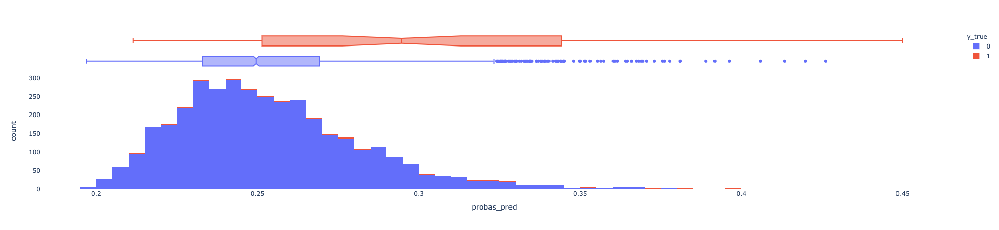

In [48]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred': probas_pred}),
                   x = 'probas_pred',
                   color = 'y_true',
                  marginal = 'box')

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

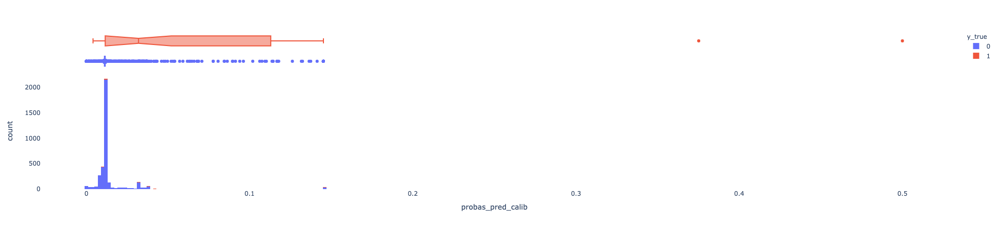

In [49]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred_calib': probas_pred_calib}),
                   x = 'probas_pred_calib',
                   color = 'y_true',
                  marginal = 'box')

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

## LGBM FOCAL LOSS OBJECTIVE (tuning two steps)
+ Metrics
+ ROC + PR curves

#### TUNE

In [50]:
def loss_function_objective(trial,
                            train_dset,
                            valid_dset,
                            model_params,
                            predict_proba_func = predict_proba):

    
    # TUNNING
    # -------------------
    alpha = trial.suggest_float('alpha',0.5, 0.99)
    gamma = trial.suggest_float('gamma',0, 5)

    focal_loss = lambda x,y: focal_loss_lgb(x, y, alpha, gamma)
    focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, alpha, gamma)
    
    lgbm_model = lgb.train(params=model_params,
                           
                           train_set=train_dset,
                           valid_sets=[valid_dset,],
                           
                           fobj = focal_loss,
                           feval = focal_loss_eval,
                           
                           early_stopping_rounds=25,
                           verbose_eval = False
                          )

    lgbm_model.predict_proba = types.MethodType(predict_proba_func, lgbm_model)
    metric = average_precision_score(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))

        
    return metric

In [51]:
def hyperparams_objective(trial,
                          train_dset,
                          valid_dset,
                          model_params,
                          predict_proba_func = predict_proba):
    # TUNNING
    # -------------------
    focal_loss = lambda x,y: focal_loss_lgb(x, y, model_params['alpha'], model_params['gamma'])
    focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, model_params['alpha'], model_params['gamma'])
    
    params_for_tunning =  {"lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
                           "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
                           "num_leaves": trial.suggest_int("num_leaves", 2, 256),
                           "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
                           "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
                           "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
                           "min_child_samples": trial.suggest_int("min_child_samples", 2, 30),
                          }
    
    model_params.update(params_for_tunning)
    
    lgbm_model = lgb.train(params=model_params,
                           
                           train_set=train_dset,
                           valid_sets=[valid_dset,],
                           
                           fobj = focal_loss,
                           feval = focal_loss_eval,
                           
                           early_stopping_rounds=25,
                           verbose_eval = False
                           )
    
    lgbm_model.predict_proba = types.MethodType(predict_proba_func, lgbm_model)

    
    # EVAL
    # -------------------
    
    #metric = log_loss(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    metric = average_precision_score(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    
    return metric

[I 2022-03-31 15:28:25,097] A new study created in memory with name: no-name-2f94c99b-0c01-433a-83c9-7a98831eccea
[I 2022-03-31 15:28:26,384] Trial 0 finished with value: 0.10674602285539746 and parameters: {'alpha': 0.6283099056034697, 'gamma': 3.5830370941107064}. Best is trial 0 with value: 0.10674602285539746.
[I 2022-03-31 15:28:28,251] Trial 1 finished with value: 0.1322248991732089 and parameters: {'alpha': 0.5990185610107459, 'gamma': 2.216804529113195}. Best is trial 1 with value: 0.1322248991732089.
[I 2022-03-31 15:28:29,280] Trial 2 finished with value: 0.09318931982817458 and parameters: {'alpha': 0.9205304158200502, 'gamma': 1.5016564775504855}. Best is trial 1 with value: 0.1322248991732089.
[I 2022-03-31 15:28:30,988] Trial 3 finished with value: 0.12960215421992752 and parameters: {'alpha': 0.5580169533303684, 'gamma': 1.8183990919152144}. Best is trial 1 with value: 0.1322248991732089.
[I 2022-03-31 15:28:31,568] Trial 4 finished with value: 0.0746126712137059 and par

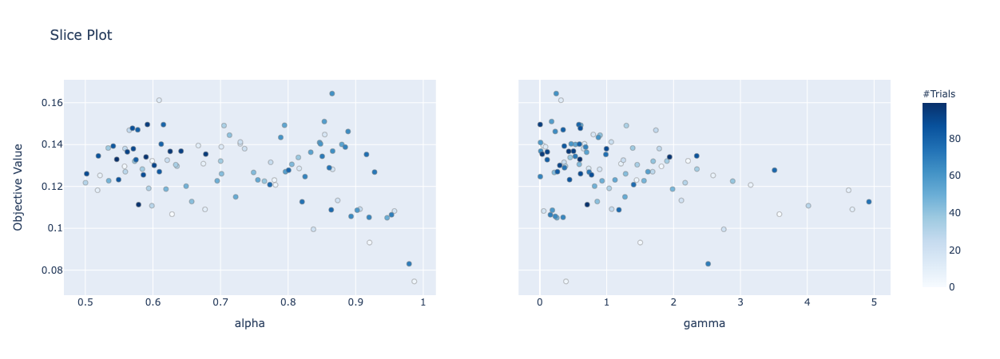

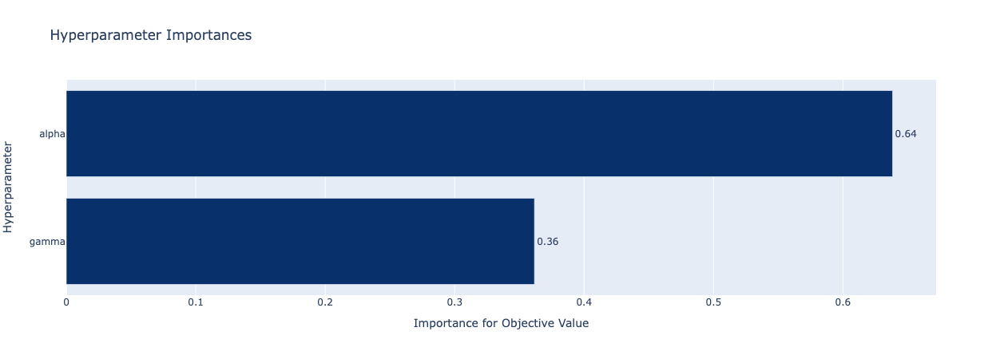

[I 2022-03-31 15:30:45,399] A new study created in memory with name: no-name-14560292-d135-4b20-b1c2-7cb8dd0bfd54


-------------------------------------------------------- 
 Number of finished trials: 100
Best trial:
  Value: 0.16438937502684922
  Params: 
    alpha: 0.86512323939881
    gamma: 0.24432622838020135
--------------------------------------------------------
{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.1, 'seed': 12, 'verbosity': -1, 'alpha': 0.86512323939881, 'gamma': 0.24432622838020135} 
 --------------------------------


[I 2022-03-31 15:30:47,687] Trial 0 finished with value: 0.13969932530595275 and parameters: {'lambda_l1': 0.00043541832807252273, 'lambda_l2': 0.000329547642073897, 'num_leaves': 9, 'feature_fraction': 0.4324243375353664, 'bagging_fraction': 0.5409037803605367, 'bagging_freq': 5, 'min_child_samples': 5}. Best is trial 0 with value: 0.13969932530595275.
[I 2022-03-31 15:30:48,664] Trial 1 finished with value: 0.12499330957327956 and parameters: {'lambda_l1': 0.00022341686884925992, 'lambda_l2': 2.7004823017980805e-07, 'num_leaves': 140, 'feature_fraction': 0.8705608945324277, 'bagging_fraction': 0.7764087518721835, 'bagging_freq': 2, 'min_child_samples': 13}. Best is trial 0 with value: 0.13969932530595275.
[I 2022-03-31 15:30:50,098] Trial 2 finished with value: 0.1231085930300396 and parameters: {'lambda_l1': 0.8426763852701846, 'lambda_l2': 7.487630182268914e-08, 'num_leaves': 16, 'feature_fraction': 0.9853853739387406, 'bagging_fraction': 0.47490674933679267, 'bagging_freq': 1, 'mi

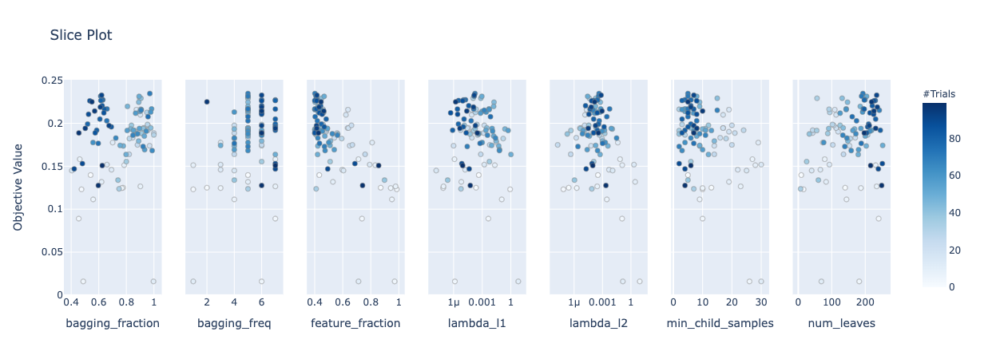

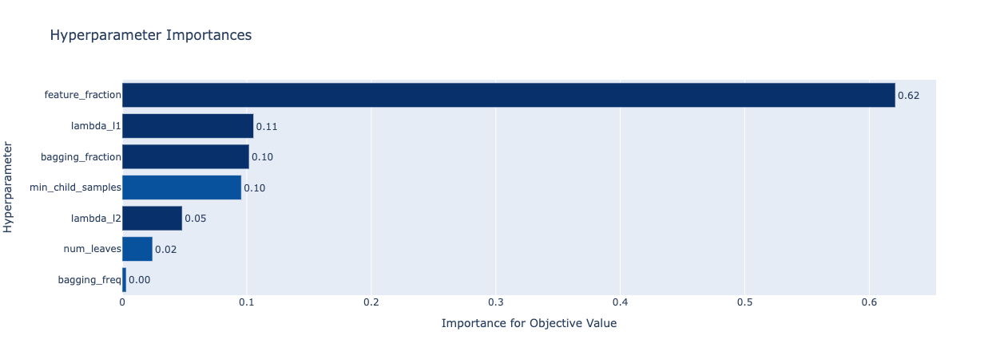

-------------------------------------------------------- 
 Number of finished trials: 100
Best trial:
  Value: 0.23456789987439924
  Params: 
    lambda_l1: 0.00017415407327247992
    lambda_l2: 0.00042812402823599654
    num_leaves: 193
    feature_fraction: 0.4014024924133984
    bagging_fraction: 0.969965590004426
    bagging_freq: 5
    min_child_samples: 5
--------------------------------------------------------
{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.1, 'seed': 12, 'verbosity': -1, 'alpha': 0.86512323939881, 'gamma': 0.24432622838020135, 'lambda_l1': 0.00017415407327247992, 'lambda_l2': 0.00042812402823599654, 'num_leaves': 193, 'feature_fraction': 0.4014024924133984, 'bagging_fraction': 0.969965590004426, 'bagging_freq': 5, 'min_child_samples': 5} 
 --------------------------------


In [52]:
lgbm_focal_loss_2_params = { "boosting": "gbdt",
                            "deterministic":True,
                            "num_iterations": 10000, #Will have early stopping for tunning
                            'learning_rate':0.1,
                            'seed':12,
                            'verbosity':-1}
    
# -----------------------------------------------------
# TUNE LOSS FUNCTION
# -----------------------------------------------------
pruner=optuna.pruners.PercentilePruner(25.0, n_startup_trials=5, n_warmup_steps=30, interval_steps=10)

loss_function_study = optuna.create_study(pruner=pruner,direction='maximize')
loss_function_study.optimize(lambda trial: 
                   loss_function_objective(trial,
                                           train_dset,
                                           valid_dset,
                                           lgbm_focal_loss_2_params),
                                n_trials=100)

best_params = get_study_results(loss_function_study)
    
del loss_function_study

lgbm_focal_loss_2_params.update(best_params)
print(f"{lgbm_focal_loss_2_params} \n --------------------------------")
 
    
# -----------------------------------------------------
# TUNE HYPERPARAMS
# -----------------------------------------------------
    
hyperparams_study = optuna.create_study(pruner=pruner,direction='maximize')
hyperparams_study.optimize(lambda trial: 
                   hyperparams_objective(trial,
                                         train_dset,
                                         valid_dset,
                                         lgbm_focal_loss_2_params),
                               n_trials=100)
    
best_params = get_study_results(hyperparams_study)
    
del hyperparams_study

lgbm_focal_loss_2_params.update(best_params)
print(f"{lgbm_focal_loss_2_params} \n --------------------------------")

#### ITERS

#### TRAIN

In [53]:
#lgbm_focal_loss_2_params['metric']=None
#lgbm_focal_loss_2_params['early_stopping_round'] = 0
#lgbm_focal_loss_2_params['num_iterations'] = int(np.median(best_iterations))
#lgbm_focal_loss_2_params['seed'] = None

print(lgbm_focal_loss_2_params)

focal_loss = lambda x,y: focal_loss_lgb(x, y, lgbm_focal_loss_2_params['alpha'], lgbm_focal_loss_2_params['gamma'])
focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, lgbm_focal_loss_2_params['alpha'], lgbm_focal_loss_2_params['gamma'])

lgbm_focal_loss_2 = lgb.train(params=lgbm_focal_loss_2_params,
                              
                              train_set=train_dset,
                              valid_sets=[valid_dset,],
                              
                              fobj = focal_loss,
                              feval = focal_loss_eval,
                              
                              early_stopping_rounds = 25,
                              num_boost_round=10000,
                              
                              verbose_eval = False)
    
lgbm_focal_loss_2.predict_proba = types.MethodType(predict_proba, lgbm_focal_loss_2)

{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.1, 'seed': 12, 'verbosity': -1, 'alpha': 0.86512323939881, 'gamma': 0.24432622838020135, 'lambda_l1': 0.00017415407327247992, 'lambda_l2': 0.00042812402823599654, 'num_leaves': 193, 'feature_fraction': 0.4014024924133984, 'bagging_fraction': 0.969965590004426, 'bagging_freq': 5, 'min_child_samples': 5}


#### CALIBRATE

In [70]:
prob_true, prob_pred = calibration_curve(calib_dset.label, lgbm_focal_loss_2.predict_proba(calib_dset.data), n_bins=100)
print(prob_true)
print(prob_pred)

[0.         0.01028807 0.01807229 0.00446429 0.00702988 0.02232143
 0.0148368  0.00454545 0.01098901 0.         0.00943396 0.
 0.03703704 0.         0.03030303 0.06896552 0.         0.
 0.         0.         0.         0.18181818 0.07142857 0.33333333
 0.         0.25       0.         0.25       0.2        0.33333333
 0.14285714 0.         0.25       0.5        0.4        0.4
 0.         0.25       0.2        0.         0.2        0.5
 1.         0.         0.         0.         0.5        1.
 0.         0.         0.         1.         0.         0.
 0.        ]
[0.03759642 0.04580561 0.05510124 0.06507787 0.07458546 0.084722
 0.09453607 0.10445476 0.11476737 0.12455609 0.13496656 0.14440131
 0.15468617 0.16520018 0.17370274 0.18461026 0.19406038 0.20553967
 0.21343566 0.22362852 0.23286541 0.24366595 0.25577707 0.26490617
 0.27463353 0.28392868 0.2979308  0.30177208 0.31457367 0.32790528
 0.33531207 0.3413521  0.35580956 0.36383833 0.37638864 0.38541119
 0.39467728 0.40400663 0.41327

In [55]:
isotonic_focal_loss_2 = IsotonicRegression(out_of_bounds='clip',y_min=0,y_max=1)
    
isotonic_focal_loss_2.fit(prob_pred, prob_true)

IsotonicRegression(out_of_bounds='clip', y_max=1, y_min=0)

In [56]:
calibs_train = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_2.predict_proba(calib_dset.data)),
                              'prob_pred_calib':isotonic_focal_loss_2.predict((lgbm_focal_loss_2.predict_proba(calib_dset.data))),
                             })

calibs_valid = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_2.predict_proba(valid_dset.data)),
                              'prob_pred_calib':isotonic_focal_loss_2.predict((lgbm_focal_loss_2.predict_proba(valid_dset.data))),
                             })

#### EVALUATE

##### Metrics

In [57]:
y_true = test_dset.label
probas_pred = (lgbm_focal_loss_2.predict_proba(test_dset.data))
label_pred = [1 if x >=0.5 else 0 for x in probas_pred]

probas_pred_calib = isotonic_focal_loss_2.predict(probas_pred)
label_pred_calib = [1 if x >=0.5 else 0 for x in probas_pred_calib]

In [58]:
avg_prec = round(average_precision_score(y_true, probas_pred),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred),4)

logloss = round(log_loss(y_true, probas_pred),4)


print(f"METRICS FOR LGBM LOGLOSS: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS: 
 ----------------------- 
 Average Precision Score  0.2191  
 AUC: 0.7492 
 LogLoss: 0.122


In [59]:
avg_prec = round(average_precision_score(y_true, probas_pred_calib),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred_calib)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred_calib)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred_calib),4)

logloss = round(log_loss(y_true, probas_pred_calib),4)


print(f"METRICS FOR LGBM LOGLOSS CALIBRATED: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS CALIBRATED: 
 ----------------------- 
 Average Precision Score  0.18  
 AUC: 0.722 
 LogLoss: 0.071


##### PR/ROC Curves

Text(0.5, 1.0, 'PR Curve \n model: LGBM LogLoss Objective')

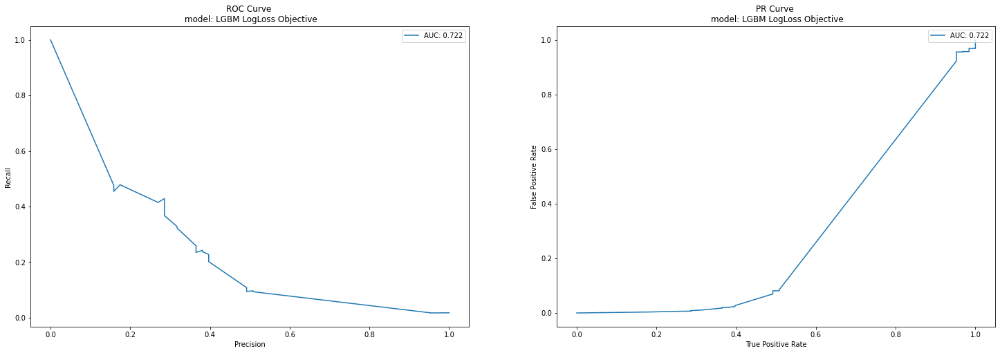

In [60]:
fig, axs = plt.subplots(1, 2, figsize = (25,8))

axs[0].plot(recall,precision, label = f"AUC: {pr_auc}")
axs[0].set_xlabel("Precision")
axs[0].set_ylabel("Recall")
axs[0].legend(loc="upper right")
axs[0].set_title(f'ROC Curve \n model: LGBM LogLoss Objective')

axs[1].plot(true_positive_rate,false_positive_rate,label = f"AUC: {pr_auc}")
axs[1].set_xlabel("True Positive Rate")
axs[1].set_ylabel("False Positive Rate")
axs[1].legend(loc="upper right")
axs[1].set_title(f'PR Curve \n model: LGBM LogLoss Objective')

##### Calibration Results

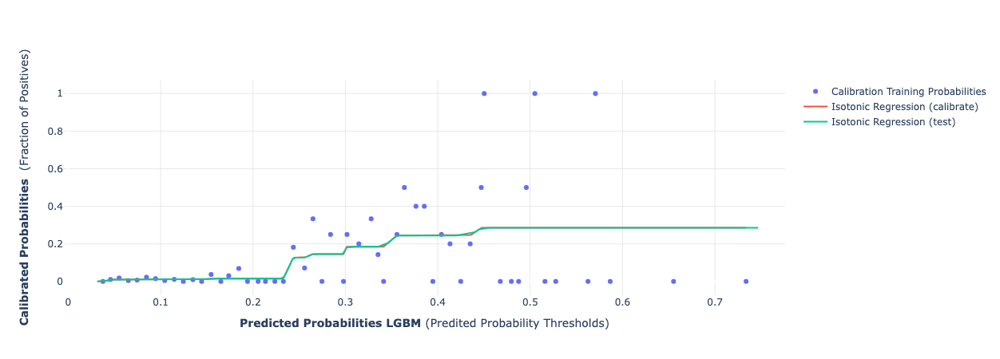

In [78]:
calibs_test = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_2.predict_proba(test_dset.data)),
                                   'prob_pred_calib':isotonic_focal_loss_2.predict((lgbm_focal_loss_2.predict_proba(test_dset.data)))
                                  })

fig = go.Figure()

fig.add_trace(go.Scatter(x=prob_pred, y=prob_true,
                    mode='markers',
                    name='Calibration Training Probabilities'))

fig.add_trace(go.Scatter(x=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (calibrate)'))

#fig.add_trace(go.Scatter(x=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         #y=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    #mode='lines',
                    #name='Isotonic Regression (validation)'))

fig.add_trace(go.Scatter(x=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (test)'))

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')

fig.update_xaxes(title_text="<b>Predicted Probabilities LGBM</b> (Predited Probability Thresholds)", showgrid=True, gridwidth=0.5, gridcolor='LightGray')
fig.update_yaxes(title_text="<b>Calibrated Probabilities</b>  (Fraction of Positives)", showgrid=True, gridwidth=0.5, gridcolor='LightGray')

#fig.update_traces(marker=dict(size=2))

fig.show()

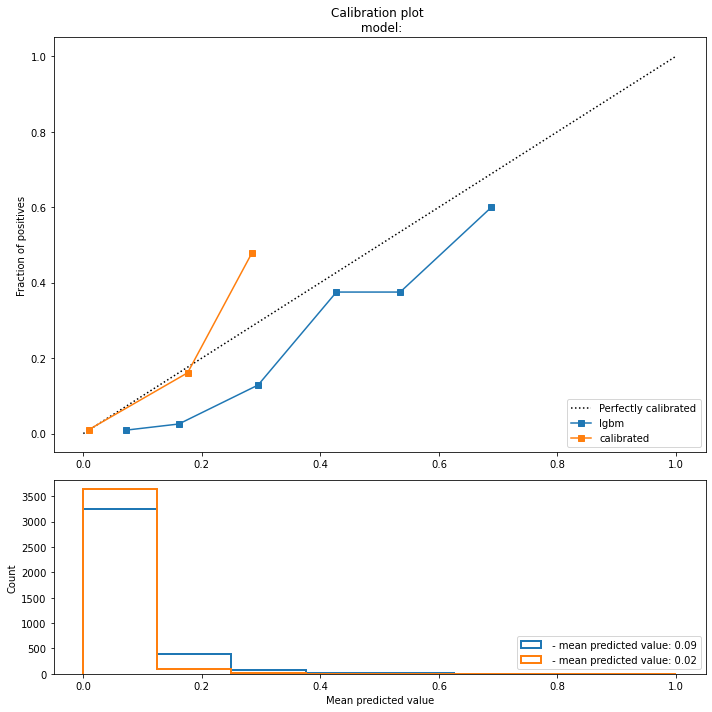

In [62]:
fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
ax2 = plt.subplot2grid((3, 1), (2, 0))
    
ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

probs = {'lgbm':probas_pred, 
         'calibrated':probas_pred_calib}

for name in ['lgbm','calibrated']:
    frac_of_pos, mean_pred_value = calibration_curve(test_dset.label, 
                                                     probs[name],
                                                     n_bins=8)

    ax1.plot(mean_pred_value, frac_of_pos, "s-", label=f'{name}')
    ax2.hist(probs[name], 
             range=(0, 1), 
             bins=8, 
             label=f' - mean predicted value: {round(np.mean(probs[name]),2)}',
             histtype="step", lw=2)
    
ax1.set_ylabel("Fraction of positives")
ax1.set_ylim([-0.05, 1.05])
ax1.legend(loc="lower right")
ax1.set_title(f'Calibration plot \n model:') #ToDo: Fix Name
    
    
ax2.legend(loc="lower right")
ax2.set_xlabel("Mean predicted value")
ax2.set_ylabel("Count")
    
plt.tight_layout()
plt.show()

##### Probability Histograms

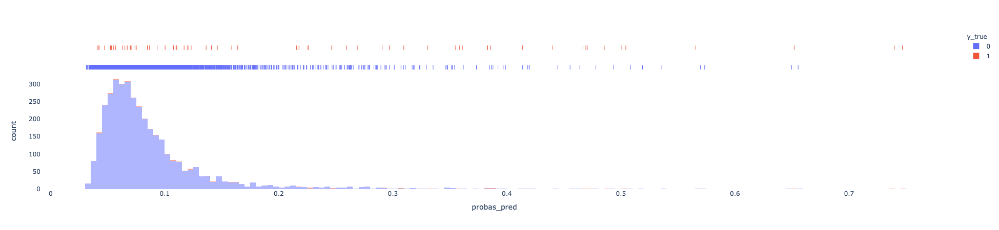

In [65]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred': probas_pred}),
                   x = 'probas_pred',
                   color = 'y_true',
                  marginal = 'rug',
                  opacity =0.5)

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

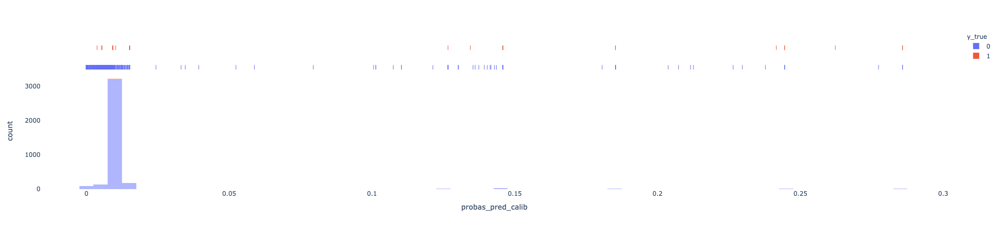

In [66]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred_calib': probas_pred_calib}),
                   x = 'probas_pred_calib',
                   color = 'y_true',
                  marginal = 'rug',
                  opacity =0.5)

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()